# Project Overview

The purpose of this project is to use data from a direct marketing campaign conducted by a Portugese banking institution in order to predict which clients are more likely to subscribe to a term deposit. This will be achieved by using exploratory data analysis, data engineering, and training a supervised classification model to predict whether a client will subscribe. 

The model would, hypothetically, have applications for any related subscription or call service and could be deployed with software to identify a priority client list for businesses.

Data Source:    
Dataset from Paulo Cortez (Univ. Minho) and Sérgio Moro (ISCTE-IUL).
S. Moro, R. Laureano and P. Cortez. Using Data Mining for Bank Direct Marketing: An Application of the CRISP-DM Methodology. In P. Novais et al. (Eds.), Proceedings of the European Simulation and Modelling Conference - ESM'2011, pp. 117-121, Guimarães, Portugal, October, 2011 EUROSIS.


Table of Contents:

1. Exploratory Data Analysis
    - Features and Target
    - Summary Statistics
    - Distributions
    - Skew and Variance
    - Relationships
2. Data Engineering
    - Separate Labels from Factors
    - One-Hot Encode Categorical Variables
    - Logarithmic Transformation
    - Normalization & Standardization
    - Train/Test Split
3. Metrics
    - Accuracy
    - F-Score
4. Models
5. Summary

In [1]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from scipy.stats import skew
from dython.nominal import associations

from sklearn.preprocessing import StandardScaler
from statsmodels.api import Logit
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, fbeta_score, make_scorer
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

%matplotlib inline

# Exploratory Data Analysis

### Features and Target

Input variables:

- age: (continuous)    
- job: type of job (categorical: "admin.","unknown","unemployed","management","housemaid",  "entrepreneur","student","blue-collar","self-employed","retired","technician","services")    
- marital: marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)    
- education: (categorical: "unknown","secondary","primary","tertiary")    
- default: has credit in default? (binary: "yes","no")    
- balance: average yearly balance, in euros (numeric)     
- housing: has housing loan? (binary: "yes","no")    
- loan: has personal loan? (binary: "yes","no")    
- contact: contact communication type (categorical: "unknown","telephone","cellular")     
- day: last contact day of the month (numeric)    
- month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")    
- duration: last contact duration, in seconds (numeric)    
- campaign: number of contacts performed during this campaign and for this client (numeric includes last contact)    
- pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)    
- previous: number of contacts performed before this campaign and for this client (numeric)    
- poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")    

Output variable (desired target):    
- y - has the client subscribed a term deposit? (binary: "yes","no")

### Summary Statistics

In [2]:
data = pd.read_csv("./data/bank-full.csv",sep=";",header=0)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [3]:
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,45211.0,NaN,NaN,NaN,40.93621,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211,12,blue-collar,9732,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,45211,3,married,27214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,45211,4,secondary,23202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,45211,2,no,44396,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,45211.0,NaN,NaN,NaN,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211,2,yes,25130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,45211,2,no,37967,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,45211,3,cellular,29285,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,45211.0,NaN,NaN,NaN,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0


In [4]:
n_obs = data.shape[0]                                   # number of obs
n_subscribed = data[data["y"] == "yes"].shape[0]        # number of clients that subscribed
n_not_subscribed = data[data["y"] == "no"].shape[0]     # number of clients that didn't subscribe
percent_subscribed = round(n_subscribed*100/n_obs, 2)   # percent of clients that subscribed
target_details = {
    "Number of observations" : n_obs,
    "Number of clients that subscribed" : n_subscribed,
    "Number of clients that didn't subscribe" : n_not_subscribed,
    "Percentage of clients that subscribed" : percent_subscribed
}

for item in target_details:
    print(f"{item}: {target_details[item]}")

Number of observations: 45211
Number of clients that subscribed: 5289
Number of clients that didn't subscribe: 39922
Percentage of clients that subscribed: 11.7


### Distributions

In [71]:
fig = px.histogram(data, x="y", nbins=2, opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Clients Subscribed", showlegend=False)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [72]:
fig = px.histogram(data, x="age", nbins=data["age"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Age", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [73]:
fig = px.histogram(data, x="marital", nbins=data["marital"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Marital Status", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [74]:
fig = px.histogram(data, x="education", nbins=data["education"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Education", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [75]:
fig = px.histogram(data, x="default", nbins=data["default"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Credit Defaulted", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [76]:
fig = px.histogram(data, x="housing", nbins=data["housing"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Clients Having Housing Loan", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [77]:
fig = px.histogram(data, x="loan", nbins=data["loan"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Clients Having Personal Loan", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [78]:
fig = px.histogram(data, x="contact", nbins=data["contact"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Contact Type", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [79]:
fig = px.histogram(data, x="month", nbins=data["month"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Last Month of Contact", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

In [80]:
fig = px.histogram(data, x="poutcome", nbins=data["poutcome"].nunique(), color="y", opacity=0.6)
fig.update_layout(height=500,width=500, title_text="Distribution of Previous Campaign Outcome", showlegend=True)
fig.update_yaxes(title_text="Number of Observations")
fig.show()

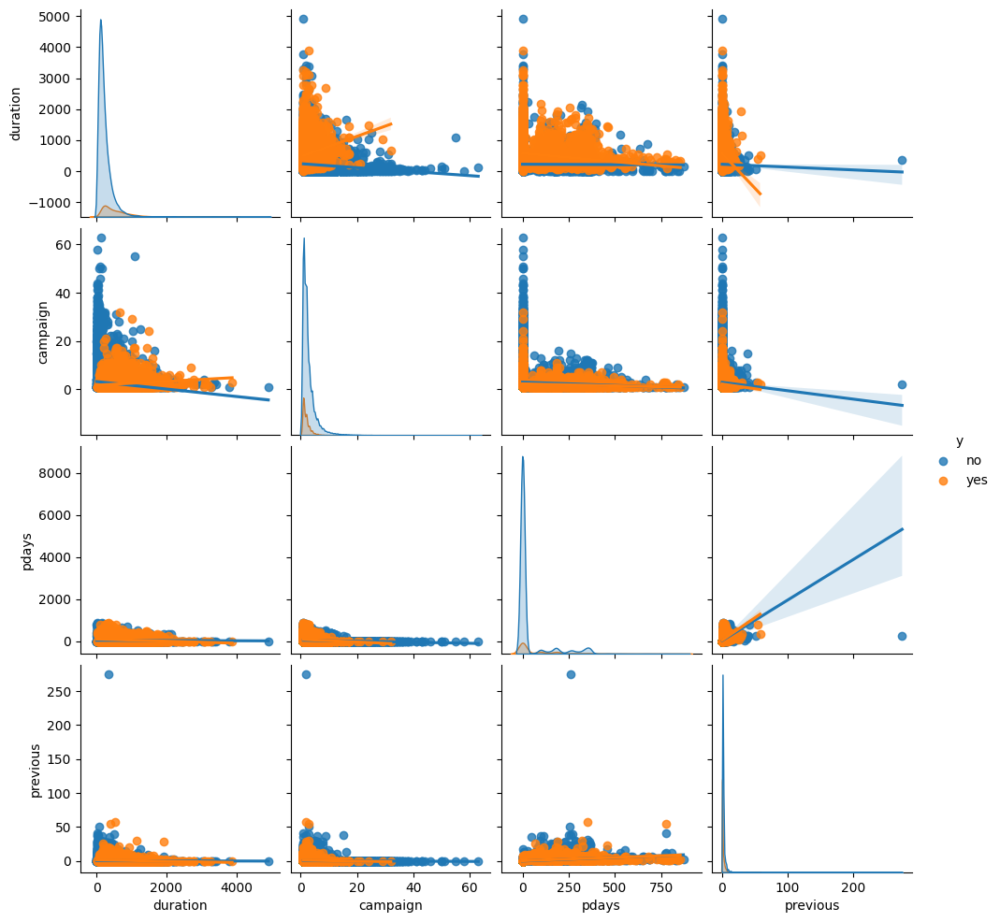

In [81]:
sns.pairplot(data[["y", "duration", "campaign", "pdays", "previous"]],
             kind="reg",
             hue="y")
plt.show()

### Skew and Variance

Some of the continuous features, **balance** and **previous**, are positively skewed. This means that the right-side of the distribution is stretched on one side. These sort of extreme outliers can hinder performance of predictive models by complicating relationships between features and the target. We can address this by performing a logarithmic transformation, which will reduce the skew and variance.

The features **balance**, **campaign**,**pdays**, and **previous** all represent distributions that are not standard normal. For example, **balance** has extreme variance and a very large mean. Distributions such as these can be bad for models for reasons similar to large skewness, and we can address it by standardizing the values to be approximately standard normal. 

In [6]:
balance = data["balance"]
campaign = data["campaign"]
pdays = data["pdays"]
prev_camp = data["previous"]
bal_skew, bal_var, bal_mean = round(skew(balance), 4), round(np.var(balance), 4), round(np.mean(balance), 4) 
camp_skew, camp_var, camp_mean = round(skew(campaign), 4), round(np.var(campaign), 4), round(np.mean(campaign), 4) 
pdays_skew, pdays_var, pdays_mean = round(skew(pdays), 4), round(np.var(pdays), 4), round(np.mean(pdays), 4) 
pc_skew, pc_var, pc_mean = round(skew(prev_camp), 4), round(np.var(prev_camp), 4), round(np.mean(prev_camp), 4) 
data_skew = pd.DataFrame({
    "Feature" : ["Balance", "Campaign", "pdays", "previous"],
    "Skew" : [bal_skew, camp_skew, pdays_skew, pc_skew],
    "Variance" : [bal_var, camp_var, pdays_var, pc_var],
    "Mean" : [bal_mean, camp_mean, pdays_mean, pc_mean]
})

display(data_skew)

,Feature,Skew,Variance,Mean
0,Balance,8.3600,9.270394e+06,1362.2721
1,Campaign,4.8985,9.597500e+00,2.7638
2,pdays,2.6156,1.002554e+04,40.1978
3,previous,41.8451,5.305700e+00,0.5803


In [7]:
fig = make_subplots(rows=4, cols=1)
fig.update_layout(height=1000, width=800, title_text="Continuous Feature Distributions", showlegend=False)

fig.add_trace(go.Histogram(x=data["balance"], nbinsx=25),
              row=1, col=1)
fig.add_trace(go.Histogram(x=data["campaign"], nbinsx=25),
              row=2, col=1)
fig.add_trace(go.Histogram(x=data["pdays"], nbinsx=25),
              row=3, col=1)
fig.add_trace(go.Histogram(x=data["previous"], nbinsx=25),
              row=4, col=1)

xaxes_labels = ["'balance' Feature Distribution","'campaign' Feature Distribution","'pdays' Feature Distribution","'previous' Feature Distribution"]

for i in range(1,5):
    fig.update_xaxes(title_text=xaxes_labels[i-1], row=i, col=1)
    fig.update_yaxes(title_text="Number of Observations", range=[0, 7500],
                     patch = dict(
                         tickmode = 'array',
                         tickvals = [0, 2500, 5000, 7500],
                         ticktext = [0, 2500, 5000, ">7500"]),
                     row=i, col=1)
fig.show()

### Relationships

Relationships between features, such as colinearity, tell us how easily one feature can be derived from another feature. For our purposes in predicting whether bank clients will purchase a subscription, we want to avoid strong relationships between our features as they will hinder the predictive ability of a model. 

Some of the more notable relationships are:
- **age** and **job** (0.50)
- **job** and **education** (0.46)
- **housing** and **month** (0.50)
- **contact** and **month** (0.51)
- **pdays** and **poutcome** (0.88)
- **previous** and **poutcome** (0.54)

Because of the strong relationships, we are going to drop **month**, **poutcome**, and **job** from our model.

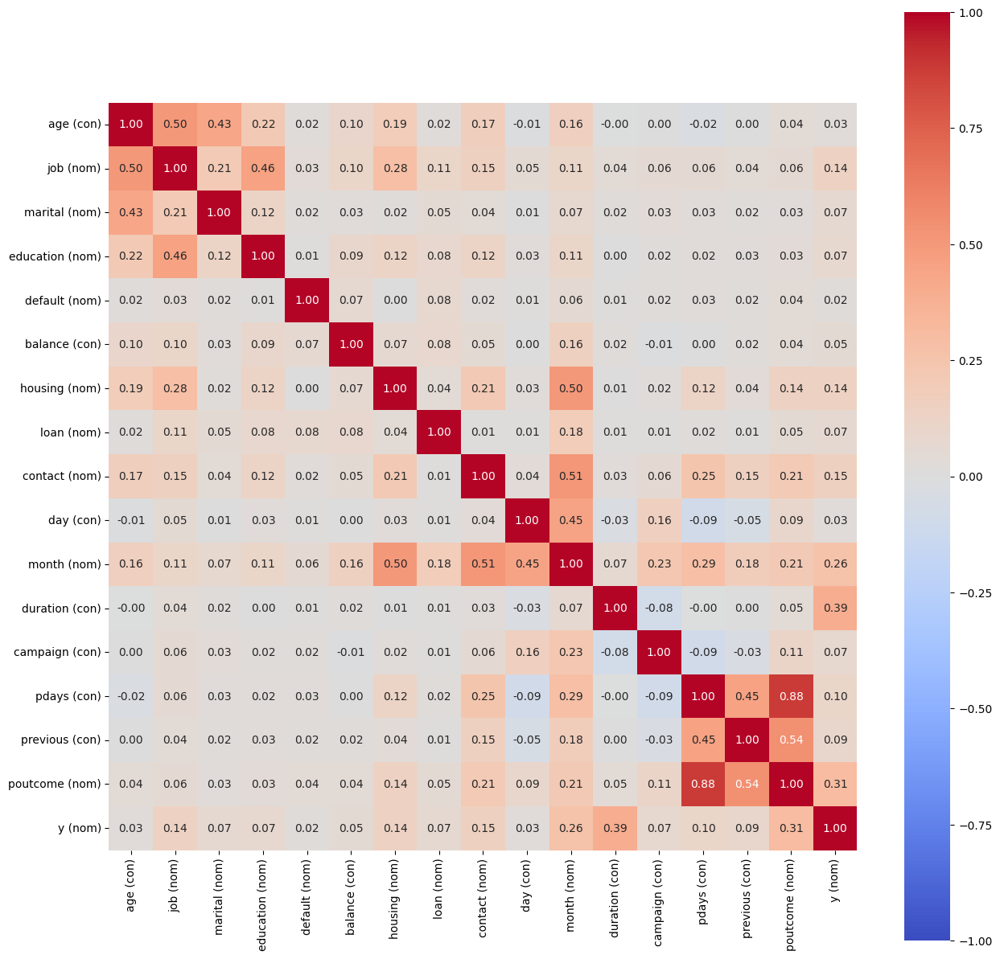

In [8]:
associations(dataset=data, mark_columns=True,  figsize=(15,15), cmap='coolwarm')
plt.show()

In [9]:
data = data.drop(["month", "poutcome", "job"], axis=1)

In [11]:
#data.to_csv("./data/cleaned_data.csv")

# Data Engineering

### Split Target and Features

In [10]:
Y = data["y"]
X = data.drop(["y"], axis=1)

### One-Hot Encode Categorical Variables

For the categorical variables, we need to encode them numerically. Luckily the `pandas` library has a `get_dummies()` function that does this for us. It works by taking a categorical variable and creating a unique feature for each category within that variable. Each new feature will then be a binary classifier: 1 if that category applies and 0 otherwise. The function will apply this process to each categorical variable within the dataset. Naturally, this can cause the number of features to get rather large. 

In [87]:
before = len(list(X.columns))
X = pd.get_dummies(X, dtype=float)
Y = (Y == "yes").apply(lambda x: x*1)
after = len(list(X.columns))

print(f"{before} before encoding")
print(f"{after} after encoding")
print("The first 10 features after encoding:")
print(list(X.columns)[:10])

13 before encoding
23 after encoding
The first 10 features after encoding:
['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous', 'marital_divorced', 'marital_married', 'marital_single']


### Transformation

As discussed earlier, some of the continuous variables are positively skewed so we can apply a logarithmic transform to reduce the skew and also the variance.

In [88]:
skewed = ["campaign", "previous"]
X_log_transformed = pd.DataFrame(data=X).copy()
X_log_transformed[skewed] = X[skewed].apply(lambda x : np.log(x + 2))

In [89]:
campaign = X_log_transformed["campaign"]
prev_camp = X_log_transformed["previous"]
camp_skew, camp_var, camp_mean = round(skew(campaign), 4), round(np.var(campaign), 4), round(np.mean(campaign), 4) 
pc_skew, pc_var, pc_mean = round(skew(prev_camp), 4), round(np.var(prev_camp), 4), round(np.mean(prev_camp), 4) 
data_skew = pd.DataFrame({
    "Feature" : ["Campaign", "Previous"],
    "Skew" : [camp_skew, pc_skew],
    "Variance" : [camp_var, pc_var],
    "Mean" : [camp_mean, pc_mean]
})

display(data_skew)

,Feature,Skew,Variance,Mean
0,Campaign,1.6202,0.1696,1.4527
1,Previous,2.9195,0.1375,0.8436


In [26]:
fig = make_subplots(rows=2, cols=1)
fig.update_layout(height=1000, width=800, title_text="Continuous Feature Distributions", showlegend=False)

fig.add_trace(go.Histogram(x=X_log_transformed["campaign"], nbinsx=25),
              row=1, col=1)
fig.add_trace(go.Histogram(x=X_log_transformed["previous"], nbinsx=25),
              row=2, col=1)

xaxes_labels = ["'campaign' Feature Distribution","'previous' Feature Distribution"]

for i in range(1,3):
    fig.update_xaxes(title_text=xaxes_labels[i-1], row=i, col=1)
    fig.update_yaxes(title_text="Number of Observations", range=[0, 7500],
                     patch = dict(
                         tickmode = 'array',
                         tickvals = [0, 2500, 5000, 7500],
                         ticktext = [0, 2500, 5000, ">7500"]),
                     row=i, col=1)
fig.show()

### Standardization

Standardizing means that we are scaling the continuous features to be roughly standard normal, $N\sim(0,1)$. Doing this helps the predictive power of our models by creating better conditioned problems. Having complex systems with numbers drastically different in scale leads to "ill conditioned" problems. These are problems where the answers are inherently unreliable since computers are not able to reliably calculate the answer.

While the resulting transformations of the standardization don't make sense on their own, such as $age = 0.11$, they will make sense in comparison to the other values.

In [27]:
numeric = ["age", "balance", "day", "duration", "campaign", "pdays", "previous"]
scaler = StandardScaler()
X_log_scaled = pd.DataFrame(data=X_log_transformed).copy()
X_log_scaled[numeric] = scaler.fit_transform(X_log_scaled[numeric])

### Train Test Split

Since the goal of a model is to find some complex relationship to generalize our data, we want to be able to test and compare the results of each model. We're going to do that by splitting our data into two groups: training and test.

The training data is going to be 80\% of the dataset and the test data will be the remaining 20\%. We also want to make sure that the proportion of clients that subscribed is the same between both sets. This will be an underlying assumption of our model that would need to be kept in mind and possibly adjusted if the model were to be deployed or scaled.

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X_log_scaled, Y, random_state=11, test_size=0.2, stratify=Y)


# Metrics

Metrics are necessary in order to score and compare models. We will be using two different ones: accuracy and f-score.

### Accuracy

As you would expect, accuracy is a measure of how often the model predicts correctly. Consider the four possibilites for a classification from a model.
- True positive (TP): predicting an observation to be 'true' when it is.
- True negative (TN): predicting an observation to be 'false' when it is.
- False positive (FP): predicting an observation to be 'true' when it is not.
- False negative (FN): predicting an observation to be 'false' when it is not.

Accuracy is the proportion of true positives and true negatives to the total number of observations, or the number of correctly predicted observations over all observations.
 
$accuracy = \frac{\sum (TP+TN)}{\sum (TP+TN+FP+FN)}$

### F-Score

F-Score is a relationship between precision and recall. Precision is a ratio of true positives over all observations predicted positive, so a high precision means there are few false positives. Recall is a ratio of true positives over all actual positives, so a high recall has few false negatives.

To define f-score formally:

$F_{\beta}=(1+\beta)\frac{Precision * Recall}{\beta^2 * Precision + Recall} $, where $\beta$ is non-negative.

$\beta$ provides a way to adjust how much we care about precision and recall. When $\beta=0$, we get a model that only cares about precision. However when $\beta$ is infinity, the model only cares about recall. For the context of our problem we are going to use $\beta = \frac12$ to penalize false positives, assuming that they would be more costly.


# Models

Now comes the time to finally train and compare models, but first we need to decide on what models to use. There are a few key attributes of our dataset that we should consider for this:
- Each data point has a defined label/target.
- The target is discrete with 2 values (i.e. binary classification).
- There are $\sim$ 45,000 data points.
- The featrues are all numerical, not textual.

All of this means that we have a supervised binary classification problem. We are going to be using models defined by `scikit-learn` so that the interface with each model class is similar, and we can streamline training and tuning with some helper functions. The models we will consider are the following:
- Benchmark: Naive Model
- Logistic regression
- K-Nearest Neighbors
- Support Vector Machine
- Random Forest
- Ada Boost
- Gradient Boost
- Single Hidden Layer Neural Network

In [29]:
model_scores = {
    "model": [],
    "train_acc": [],
    "test_acc": [],
    "f_train": [],
    "f_test": [],
    "params": []
}

def update_model_scores(model, train_acc, test_acc, f_train, f_test, params="default", model_scores=model_scores):
    model_scores["model"].append(model)
    model_scores["train_acc"].append(train_acc)
    model_scores["test_acc"].append(test_acc)
    model_scores["f_train"].append(f_train)
    model_scores["f_test"].append(f_test)
    model_scores["params"].append(params)


### Benchmark

To create a baseline for comparing models, we will use a naive model that always predicts that a client will subscribe. This is important because it gives us an idea of what a happens if we don't leverage anyknowledge about the data. It's expected that this will perform poorly, but will still give context for the performance of other models.

In [30]:
true_pos = np.sum(Y)
true_neg = 0
false_pos = len(Y) - true_pos
false_neg = 0

accuracy = (true_pos + true_neg)/len(Y)
recall = true_pos/(true_pos + false_neg)
precision = true_pos/(true_pos + false_pos)
beta = 0.5
numer = (1 + beta**2)*precision*recall
denom = (precision*beta**2) + recall
fscore = numer/denom

print(f"Benchmark model:\n\t Accuracy: {accuracy:.4f}\n\t F-Score: {fscore:.4f}")
update_model_scores("Benchmark", "n/a", accuracy, "n/a", fscore)

Benchmark model:
	 Accuracy: 0.1170
	 F-Score: 0.1421


### Helper Functions for Streamlined Training & Testing

In [31]:
def train_model(model, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test):
    results = {}

    # train
    #start = time()
    model.fit(X_train, y_train)
    #end = time()
    #results["train_time"] = end - start

    # predict
    #start = time()
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)
    #end = time()
    #results["predict_time"] = end - start

    results["train_acc"] = accuracy_score(y_train, train_pred)
    results["test_acc"] = accuracy_score(y_test, test_pred)
    results["f_train"] = fbeta_score(y_train, train_pred, beta=0.5)
    results["f_test"] = fbeta_score(y_test, test_pred, beta=0.5)

    return results

In [32]:
def tune_with_grid(model, params, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test):
    scorer = make_scorer(fbeta_score, beta=0.5)
    grid = GridSearchCV(estimator=model, param_grid=params, scoring=scorer)
    grid_fit = grid.fit(X_train, y_train)

    best_params = grid_fit.best_estimator_
    #preds = model.fit(X_train, y_train).predict(X_test)
    train_pred = best_params.predict(X_train)
    test_pred = best_params.predict(X_test)

    results = {}
    results["train_acc"] = accuracy_score(y_train, train_pred)
    results["test_acc"] = accuracy_score(y_test, test_pred)
    results["f_train"] = fbeta_score(y_train, train_pred, beta=0.5)
    results["f_test"] = fbeta_score(y_test, test_pred, beta=0.5)
    results["params"] = best_params

    #print(f"Accuracy: {accuracy:.4f}\t F-Score: {f_test:.4f}")
    #print("Best Parameters:")
    #print(f"\t{best_params}")
    return results

### Logistic Regression

In [33]:
log_reg_oob = train_model(model=LogisticRegression(random_state=11))

print(f"Logistic Regression: Out-of-the-Box")
display(pd.DataFrame.from_dict(log_reg_oob, orient='index').T)
update_model_scores("LogReg:oob", log_reg_oob["train_acc"], log_reg_oob["test_acc"], log_reg_oob["f_train"], log_reg_oob["f_test"])

Logistic Regression: Out-of-the-Box


,train_acc,test_acc,f_train,f_test
0,0.890704,0.893288,0.43954,0.469091


### K-Nearest Neighbors Classifier

In [34]:
knn_oob = train_model(model=KNeighborsClassifier())

print(f"K-Nearest Neighbors: Out-of-the-Box")
display(pd.DataFrame.from_dict(knn_oob, orient='index').T)
update_model_scores("KNN:oob", knn_oob["train_acc"], knn_oob["test_acc"], knn_oob["f_train"], knn_oob["f_test"])

K-Nearest Neighbors: Out-of-the-Box


,train_acc,test_acc,f_train,f_test
0,0.914814,0.887758,0.640626,0.4792


In [35]:
knn_params = {
    "n_neighbors": list(range(5, int(math.sqrt(len(y_train))), 5))
}
knn_tune = tune_with_grid(model=KNeighborsClassifier(), params=knn_params)
print(f"K-Nearest Neighbors: Tuned")
display(pd.DataFrame.from_dict(knn_tune, orient='index').T)
update_model_scores("KNN:tuned", knn_tune["train_acc"], knn_tune["test_acc"], knn_tune["f_train"], knn_tune["f_test"], params=knn_tune["params"])


K-Nearest Neighbors: Tuned


,train_acc,test_acc,f_train,f_test,params
0,0.897838,0.893509,0.507942,0.482515,KNeighborsClassifier(n_neighbors=25)


### Support Vector Classifier

In [36]:
svc_oob = train_model(model=SVC(random_state=11))

print(f"Support Vector Classifier: Out-of-the-Box")
display(pd.DataFrame.from_dict(svc_oob, orient='index').T)
update_model_scores("SVC:oob", svc_oob["train_acc"], svc_oob["test_acc"], svc_oob["f_train"], svc_oob["f_test"])

Support Vector Classifier: Out-of-the-Box


,train_acc,test_acc,f_train,f_test
0,0.899469,0.894725,0.51188,0.478998


In [37]:
svc_params = {
    "C": [1e-2, 0.1, 1, 10, 100]
}
svc_tune = tune_with_grid(model=SVC(), params=svc_params)
print(f"SVC: Tuned")
display(pd.DataFrame.from_dict(svc_tune, orient='index').T)
update_model_scores("SVC:tuned", svc_tune["train_acc"], svc_tune["test_acc"], svc_tune["f_train"], svc_tune["f_test"], params=svc_tune["params"])

SVC: Tuned


,train_acc,test_acc,f_train,f_test,params
0,0.913791,0.896163,0.636115,0.515106,SVC(C=10)


### Ada Boost Classifier

In [38]:
ada_oob = train_model(model=AdaBoostClassifier(random_state=11))

print(f"Ada Boost Classifier: Out-of-the-Box")
display(pd.DataFrame.from_dict(ada_oob, orient='index').T)
update_model_scores("Ada:oob", ada_oob["train_acc"], ada_oob["test_acc"], ada_oob["f_train"], ada_oob["f_test"])

Ada Boost Classifier: Out-of-the-Box


,train_acc,test_acc,f_train,f_test
0,0.894409,0.89373,0.50134,0.504877


In [39]:
ada_params = {
    "n_estimators": [10, 50, 100, 500, 1000, 5000]
}
ada_tune = tune_with_grid(model=AdaBoostClassifier(), params=ada_params)
print(f"Ada Boost: Tuned")
display(pd.DataFrame.from_dict(ada_tune, orient='index').T)
update_model_scores("Ada:tuned", ada_tune["train_acc"], ada_tune["test_acc"], ada_tune["f_train"], ada_tune["f_test"], params=ada_tune["params"])

Ada Boost: Tuned


,train_acc,test_acc,f_train,f_test,params
0,0.903755,0.896937,0.571149,0.534311,"(DecisionTreeClassifier(max_depth=1, random_st..."


### Random Forest Classifier

In [40]:
for_oob = train_model(model=RandomForestClassifier(random_state=11))

print(f"Random Forest: Out-of-the-Box")
display(pd.DataFrame.from_dict(for_oob, orient='index').T)
update_model_scores("For:oob", for_oob["train_acc"], for_oob["test_acc"], for_oob["f_train"], for_oob["f_test"])

Random Forest: Out-of-the-Box


,train_acc,test_acc,f_train,f_test
0,1.0,0.894946,1.0,0.515651


In [41]:
for_params = {
   "n_estimators": [10, 50, 100, 500, 1000],
   "criterion": ["gini", "entropy", "log_loss"]
}
for_tune = tune_with_grid(model=RandomForestClassifier(), params=for_params)
print(f"Random Forest: Tuned")
display(pd.DataFrame.from_dict(for_tune, orient='index').T)
update_model_scores("For:tuned", for_tune["train_acc"], for_tune["test_acc"], for_tune["f_train"], for_tune["f_test"], params=for_tune["params"])

Random Forest: Tuned


,train_acc,test_acc,f_train,f_test,params
0,0.999945,0.8976,0.999905,0.532213,"(DecisionTreeClassifier(max_features='sqrt', r..."


### Gradient Boosted Classifier

In [42]:
grad_oob = train_model(model=GradientBoostingClassifier(random_state=11))

print(f"Gradient Boost: Out-of-the-Box")
display(pd.DataFrame.from_dict(grad_oob, orient='index').T)
update_model_scores("Grad:oob", grad_oob["train_acc"], grad_oob["test_acc"], grad_oob["f_train"], grad_oob["f_test"])

Gradient Boost: Out-of-the-Box


,train_acc,test_acc,f_train,f_test
0,0.903644,0.899701,0.57008,0.549974


In [43]:
grad_params = {
    "learning_rate": [1e-1, 1e-2, 1e-3, 1e-4],
    "n_estimators": [10, 50, 100, 500, 1000]
}
grad_tune = tune_with_grid(model=GradientBoostingClassifier(), params=grad_params)
print(f"Gradient Boost: Tuned")
display(pd.DataFrame.from_dict(grad_tune, orient='index').T)
update_model_scores("Grad:tuned", grad_tune["train_acc"], grad_tune["test_acc"], grad_tune["f_train"], grad_tune["f_test"], params=grad_tune["params"])

Gradient Boost: Tuned


,train_acc,test_acc,f_train,f_test,params
0,0.928749,0.899149,0.722765,0.549618,([DecisionTreeRegressor(criterion='friedman_ms...


### Single Hidden Layer Neural Network

In [44]:
nn_oob = train_model(model=MLPClassifier(random_state=11))

print(f"Neural Network: Out-of-the-Box")
display(pd.DataFrame.from_dict(nn_oob, orient='index').T)
update_model_scores("NN:oob", nn_oob["train_acc"], nn_oob["test_acc"], nn_oob["f_train"], nn_oob["f_test"])

Neural Network: Out-of-the-Box


C:\Users\jamcc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



,train_acc,test_acc,f_train,f_test
0,0.909091,0.896384,0.603298,0.521135


In [45]:
nn_params = {
    "hidden_layer_sizes": [(32,), (64,), (128,), (256,), (512,)],
    "learning_rate": ["constant", "invscaling", "adaptive"],
    "max_iter": [100, 500, 1000, 2500, 5000]
}
nn_tune = tune_with_grid(model=MLPClassifier(), params=nn_params)
print(f"Neural Network: Tuned")
display(pd.DataFrame.from_dict(nn_tune, orient='index').T)
update_model_scores("NN:tuned", nn_tune["train_acc"], nn_tune["test_acc"], nn_tune["f_train"], nn_tune["f_test"], params=nn_tune["params"])

C:\Users\jamcc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\jamcc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\jamcc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\jamcc\AppData\Local\Packages\PythonSoftwareFoundatio

Neural Network: Tuned


C:\Users\jamcc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.



,train_acc,test_acc,f_train,f_test,params
0,0.903589,0.896163,0.574116,0.535627,"MLPClassifier(hidden_layer_sizes=(64,), learni..."


### Summary

In [92]:
display(pd.DataFrame.from_dict(model_scores, orient='index').T)

,model,train_acc,test_acc,f_train,f_test,params
0,Benchmark,n/a,0.116985,n/a,0.142076,default
1,LogReg:oob,0.890704,0.893288,0.43954,0.469091,default
2,KNN:oob,0.914814,0.887758,0.640626,0.4792,default
3,KNN:tuned,0.897838,0.893509,0.507942,0.482515,KNeighborsClassifier(n_neighbors=25)
4,SVC:oob,0.899469,0.894725,0.51188,0.478998,default
5,SVC:tuned,0.913791,0.896163,0.636115,0.515106,SVC(C=10)
6,Ada:oob,0.894409,0.89373,0.50134,0.504877,default
7,Ada:tuned,0.903755,0.896937,0.571149,0.534311,"(DecisionTreeClassifier(max_depth=1, random_st..."
8,For:oob,1.0,0.894946,1.0,0.515651,default
9,For:tuned,0.999945,0.8976,0.999905,0.532213,"(DecisionTreeClassifier(max_features='sqrt', r..."


The Gradient Boosting Classifier was the best model with a F-score of 0.55 when evaluating the test set. The Random Forest Classifier seems to overfit the training data since it has perfect training scores but the test set evaluation is mediocre.

Moving forward from here, we would be able to take a look at the amount of time it took to train the Gradient Boosting Classifier. It may be worthwhile to use a smaller training set to cut down on training time if the predictive accuracy is identical. Besides that, the next step would be to deploy the model by integrating it into software for applicable usage for identifying customers more likely to subscribe to the services. 